# Spotify

Data Visualization - Group Assignment

Team E - **William Kingwill, Julius von Selchow, Emily Yorke, Sydne-Aline Strasser, Tarek ElNoury, Alain Grullon**

Data - https://github.com/rfordatascience/tidytuesday/blob/master/data/2020/2020-01-21/readme.md


**--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

# Agenda

**I. Python environment setup**

**II. Data source set-up**
  
**III. Explorative Data Analysis (EDA)**
  1. Missing Values Analysis & Handling
  2. Data Cleaning
  3. Feature Factorization
  
**IV. Visulization**

# Business Case Structure

1. Top 50 Songs
2. Trends
3. ...

## Dataset Info
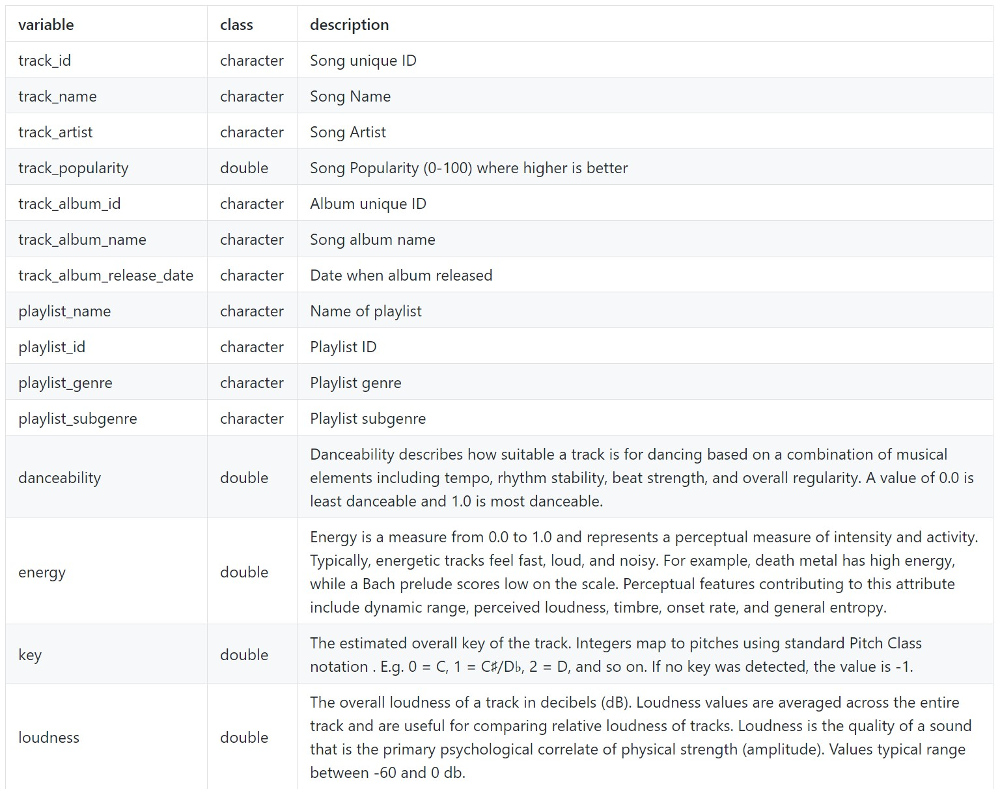
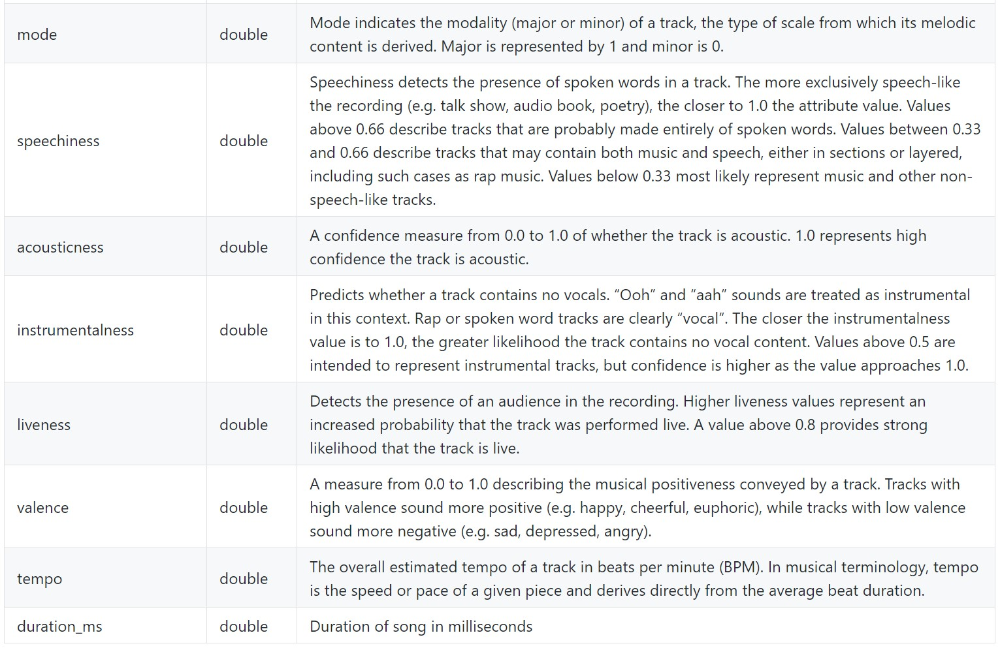

## I. Environment setup

In [1]:
# data manuipulation
import numpy as np
import pandas as pd
import pandas_profiling

# plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# styling
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>")) # Increase cell width
display(HTML("<style>.rendered_html { font-size: 16px; }</style>")) # Increase font size
plt.style.use("fivethirtyeight")
sns.set_style('whitegrid')
sns.set_context('talk')

## II. Data source setup

In [2]:
spotify_df = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv')
spotify_df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


# III. Explorative Data Analysis (EDA)

In [3]:
#import warnings
import warnings 
warnings.filterwarnings('ignore')

report = pandas_profiling.ProfileReport(spotify_df)
report

## 3.1. Missing Values Analysis & Handling

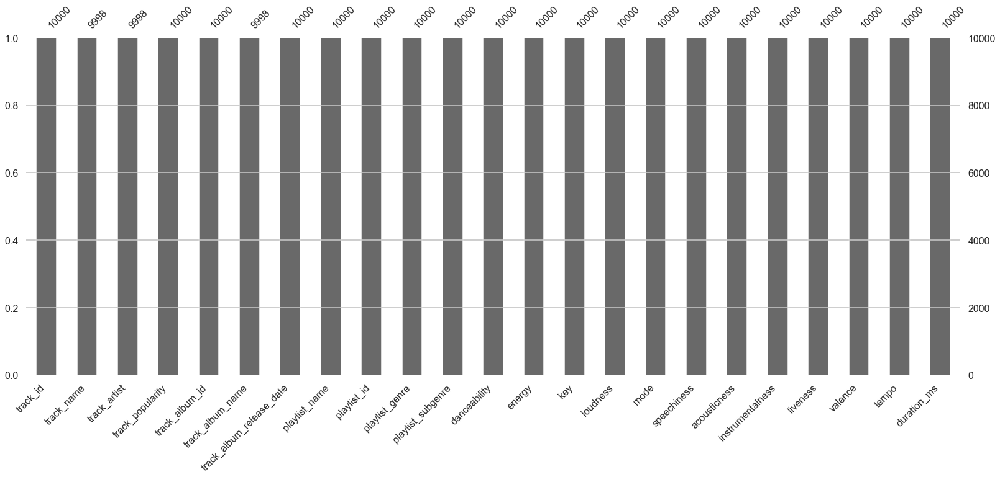

In [4]:
import missingno as msno
%matplotlib inline
msno.bar(spotify_df.sample(10000))

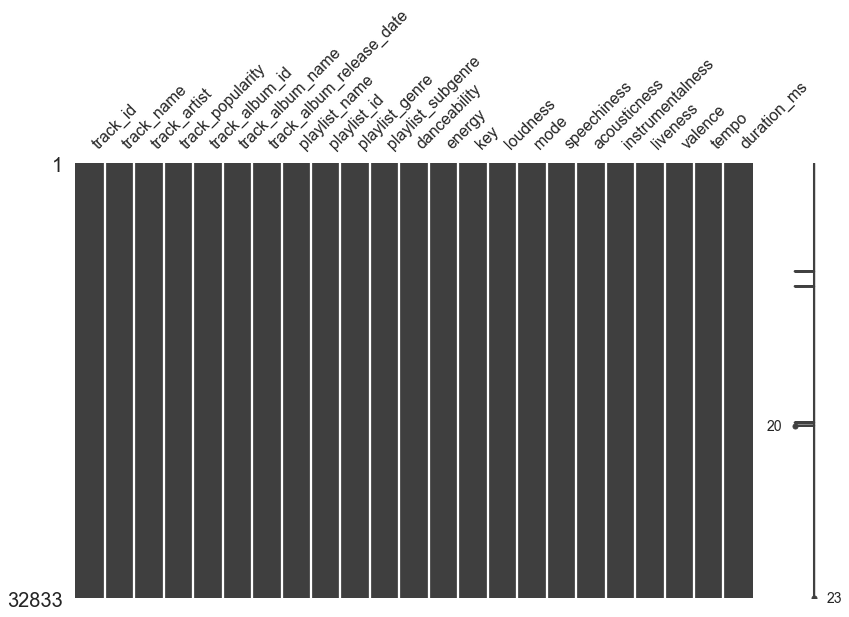

In [5]:
msno.matrix(spotify_df, figsize=(12,8))

In [6]:
#checking for null values
spotify_df.isnull().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

***Missing values in track_name, track_artist and track_album_name. Should be dropped!***

In [7]:
#since only 5 rows have null values we will drop the null values
spotify_df.dropna(axis=0)

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,189052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),2014-04-28,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,2013-03-08,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),2014-04-21,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),2014-01-01,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432


## 3.2. Data Cleaning

In [8]:
# drop unnecessary columns
spotify_df = spotify_df.drop(["track_id","track_album_id", "playlist_id"], axis= 1)

In [9]:
#renaming some columns for easier reference
spotify_df.rename(columns={'track_name':"title",'track_artist':'artist','track_popularity':'title_popularity',
                        'track_album_name':'album','track_album_release_date':'album_release_date'},inplace=True)

In [10]:
#get dimensions of the dataset
spotify_df.shape

(32833, 20)

## 3.3. Feature Factorization

In [11]:
#Counting unique artists
print("The spotify_df_df_df dataset entails " + str(spotify_df.artist.nunique()) + " unique artists")

The spotify_df_df_df dataset entails 10692 unique artists


In [12]:
# date-time conversion
spotify_df['album_release_date'] = pd.to_datetime(spotify_df.album_release_date)

In [13]:
# create year column
spotify_df['album_release_year'] = pd.DatetimeIndex(spotify_df['album_release_date']).year

# create month column
spotify_df['album_release_month'] = pd.DatetimeIndex(spotify_df['album_release_date']).month

# create day column
spotify_df['album_release_day'] = pd.DatetimeIndex(spotify_df['album_release_date']).day

In [14]:
spotify_df.album_release_year.nunique()

63

### 3.4. Correlations

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5]),
 <a list of 16 Text major ticklabel objects>)

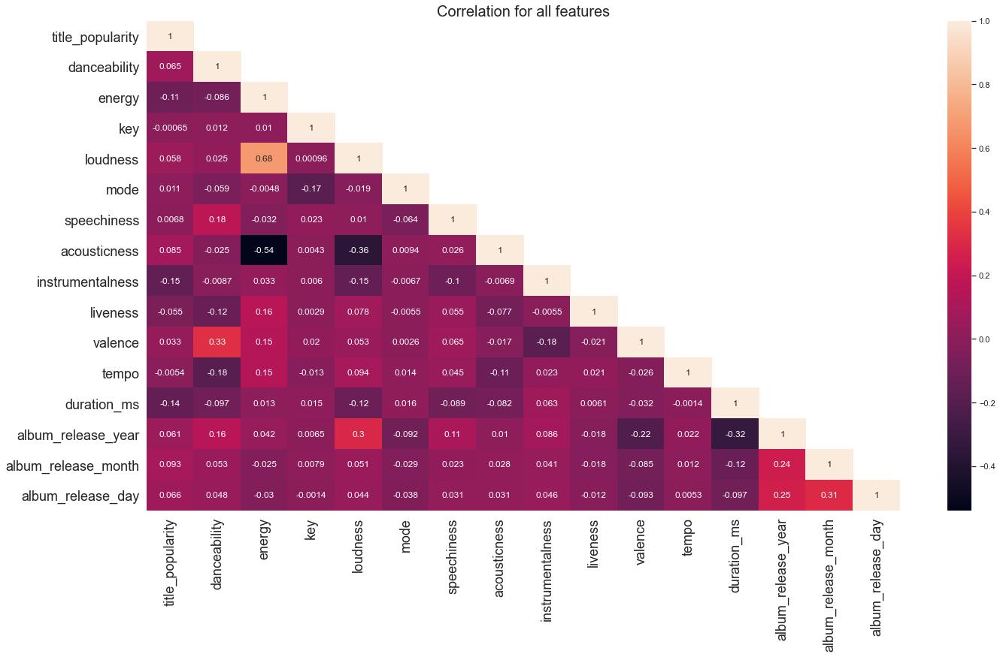

In [15]:
plt.figure(figsize=(20, 12))
sns.set(style="whitegrid")
corr = spotify_df.corr()

mask = np.array(corr)
# Turning the lower-triangle of the array to false
mask[np.tril_indices_from(mask)] = False
sns.heatmap(corr,mask=mask,annot=True)
plt.title("Correlation for all features", fontsize= 20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

#### Conclusions
"Loudness" and "Energy" have a decent positive correlation for example. All other features seem to not be correlated and therefore have no relationship.

In [16]:
popularity_df = spotify_df.groupby("title")["title_popularity"].mean().sort_values(ascending=False).head(10)
popularity_df = pd.DataFrame(popularity_df).reset_index()
popularity_df

,title,title_popularity
0,Tusa,98.000000
1,The Box,98.000000
2,everything i wanted,97.000000
3,Don't Start Now,97.000000
4,RITMO (Bad Boys For Life),96.000000
5,bad guy,95.000000
6,Yummy,95.000000
7,Blinding Lights,94.333333
8,Someone You Loved,94.000000
9,HIGHEST IN THE ROOM,94.000000


# 4. Visualizations

Text(0.5, 1.0, 'The most popular songs across all years')

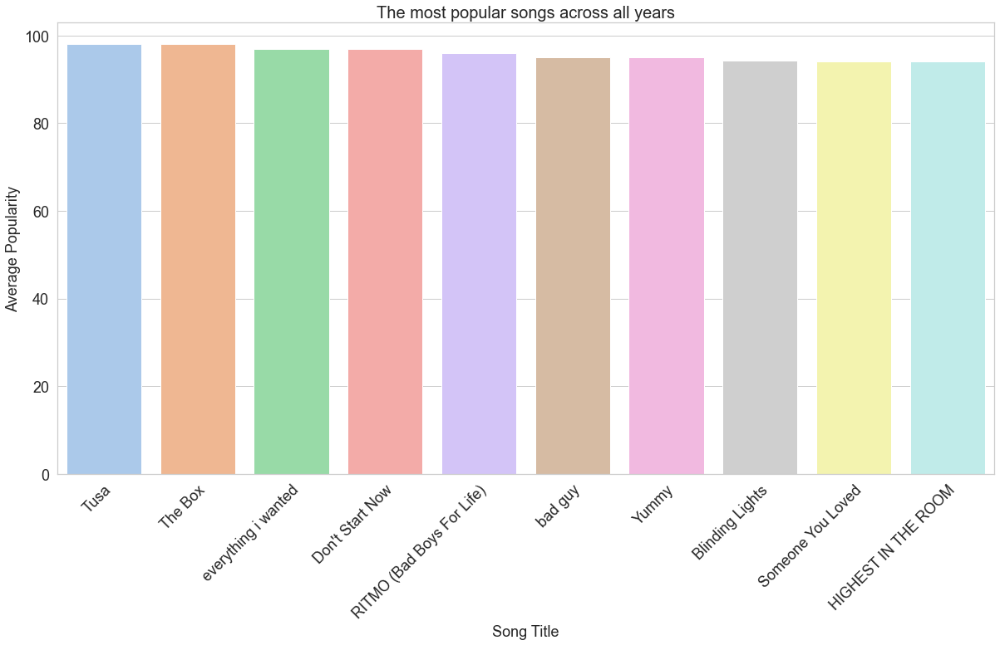

In [17]:
plt.figure(figsize=(18, 10))
popular = sns.barplot(data= popularity_df, x= popularity_df.title, y= popularity_df.title_popularity, palette="pastel")
plt.xticks(rotation = 45, rotation_mode= "anchor", ha="right", fontsize=18)
plt.yticks(fontsize=18)
popular.set_ylabel("Average Popularity",fontsize=18)
popular.set_xlabel("Song Title",fontsize=18)
popular.set_title("The most popular songs across all years", fontsize=20)

In [18]:
artists_df = spotify_df[spotify_df["album_release_year"] == 2019].groupby("artist")["title_popularity"].sum().sort_values(ascending=False).head(10)
artists_df = pd.DataFrame(artists_df).reset_index()
artists_df

,artist,title_popularity
0,Ed Sheeran,3312
1,Billie Eilish,2715
2,Martin Garrix,2457
3,Camila Cabello,2245
4,The Chainsmokers,2203
5,Kygo,2174
6,Dimitri Vegas & Like Mike,2139
7,Post Malone,2137
8,Young Thug,2065
9,Harry Styles,1958


Text(0.5, 1.0, 'The most popular artists in 2019')

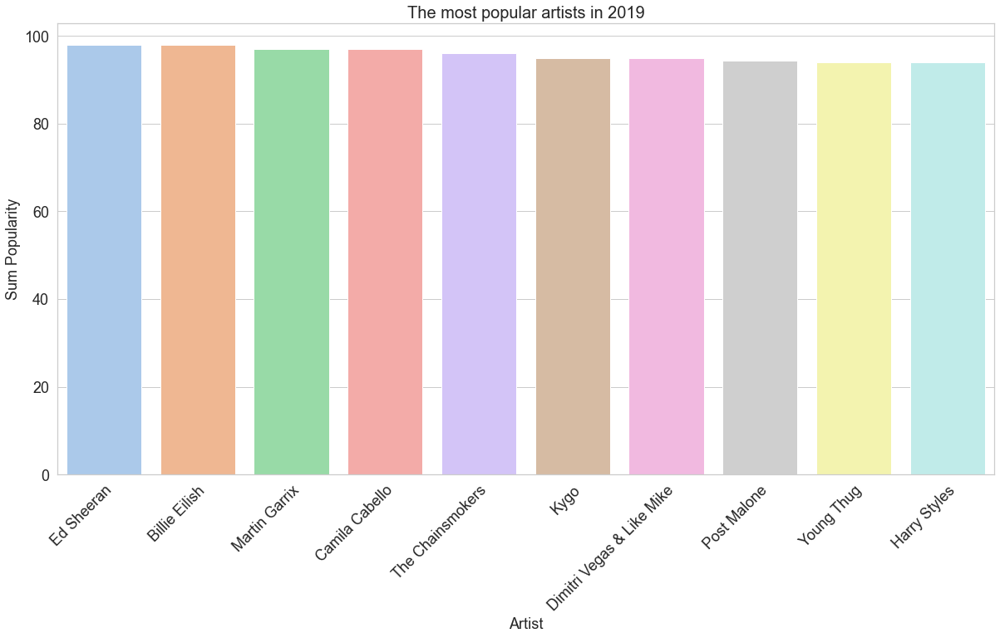

In [19]:
plt.figure(figsize=(18, 10))
artists = sns.barplot(data= artists_df, x= artists_df.artist, y= popularity_df.title_popularity, palette="pastel")
plt.xticks(rotation = 45, rotation_mode= "anchor", ha="right", fontsize=18)
plt.yticks(fontsize=18)
artists.set_ylabel("Sum Popularity",fontsize=18)
artists.set_xlabel("Artist",fontsize=18)
artists.set_title("The most popular artists in 2019", fontsize=20)

In [20]:
#how have some acoustic features changed over the years?
acoustic = spotify_df.groupby("album_release_year")
acoustic = pd.DataFrame(acoustic["loudness", "energy", "danceability", "loudness", "tempo"].mean()).reset_index()
acoustic

,album_release_year,loudness,energy,danceability,loudness,tempo
0,1957,-4.002000,0.780000,0.519500,-4.002000,166.646000
1,1958,-9.538000,0.582000,0.647000,-9.538000,167.396000
2,1960,-9.011500,0.464750,0.386250,-9.011500,149.153000
3,1961,-14.145000,0.036000,0.585000,-14.145000,151.223000
4,1962,-8.741000,0.514000,0.816000,-8.741000,136.837000
...,...,...,...,...,...,...
58,2016,-6.237209,0.695969,0.650296,-6.237209,120.189969
59,2017,-6.429812,0.682702,0.663332,-6.429812,120.343258
60,2018,-6.552025,0.674790,0.678906,-6.552025,120.135725
61,2019,-6.296265,0.696706,0.677474,-6.296265,122.251668


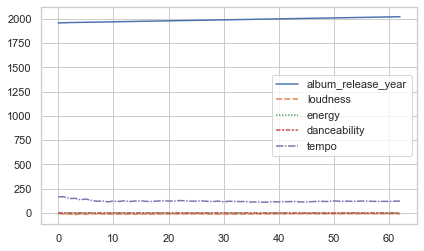

In [21]:
#sns.set(style="whitegrid")
acou = sns.lineplot(data=acoustic, hue= acoustic[["loudness", "energy", "danceability", "loudness", "tempo"]])

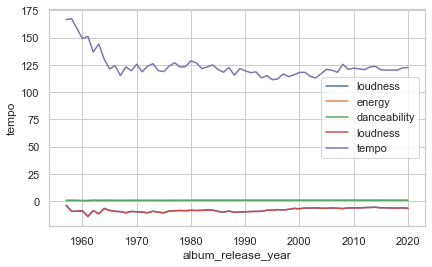

In [22]:
columns = ["loudness", "energy", "danceability", "loudness", "tempo"]
for col in columns:
    x = spotify_df.groupby("album_release_year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)


In [23]:
list(spotify_df.columns)

['title',
 'artist',
 'title_popularity',
 'album',
 'album_release_date',
 'playlist_name',
 'playlist_genre',
 'playlist_subgenre',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'album_release_year',
 'album_release_month',
 'album_release_day']

### Top 50 tracks

In [24]:
#spotify_df['top_50_energy'] = spotify_df['energy'].nlargest(50)
#spotify_df['top_50_track_popularity'] = spotify_df['track_popularity'].nlargest(50)

### Dependence between Acousticness and popularity

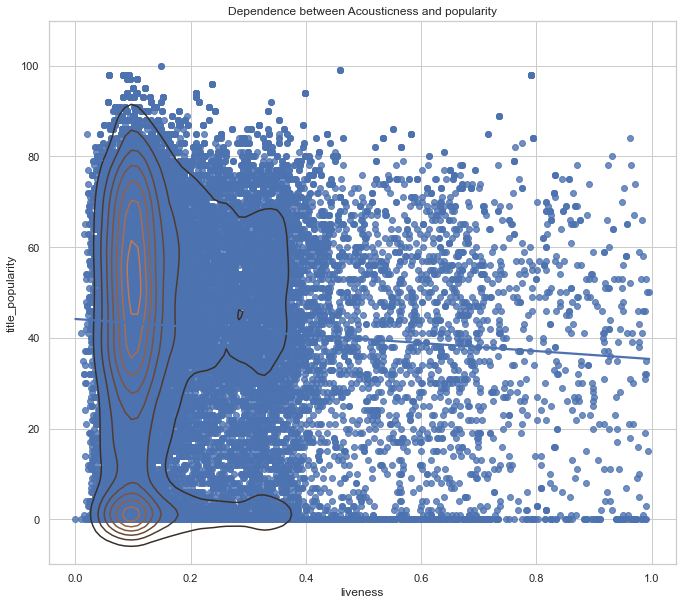

In [25]:
fig=plt.subplots(figsize=(10,10))
plt.title('Dependence between Acousticness and popularity',fontsize=12)
sns.regplot(x='liveness', y='title_popularity',
            ci=None, data=spotify_df)
sns.kdeplot(spotify_df.liveness, spotify_df.title_popularity)
plt.show()

### Dependence between Liveness and popularity

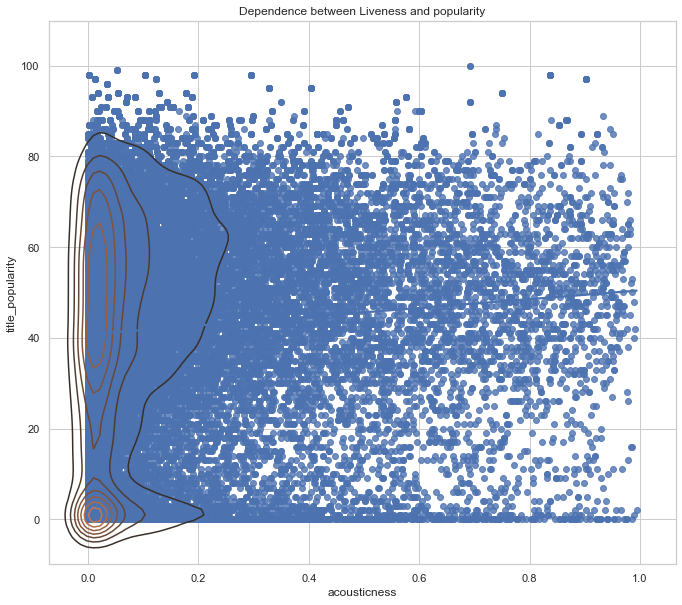

In [26]:
fig=plt.subplots(figsize=(10,10))

plt.title('Dependence between Liveness and popularity',fontsize=12)
sns.regplot(x='acousticness', y='title_popularity',
            ci=None, data=spotify_df)
sns.kdeplot(spotify_df.acousticness,spotify_df.title_popularity)
plt.show()

### Dependence between Loudness and popularity

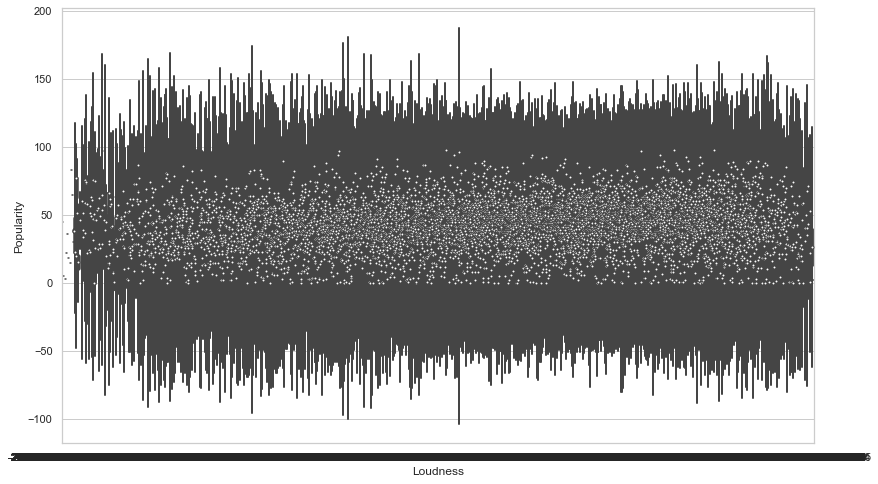

In [27]:
plt.figure(figsize=(12,8))
sns.violinplot(x='loudness', y='title_popularity', data=spotify_df)
plt.xlabel('Loudness', fontsize=12)
plt.ylabel('Popularity', fontsize=12)
plt.show()

### Energy vs Popularity

<Figure size 864x576 with 0 Axes>

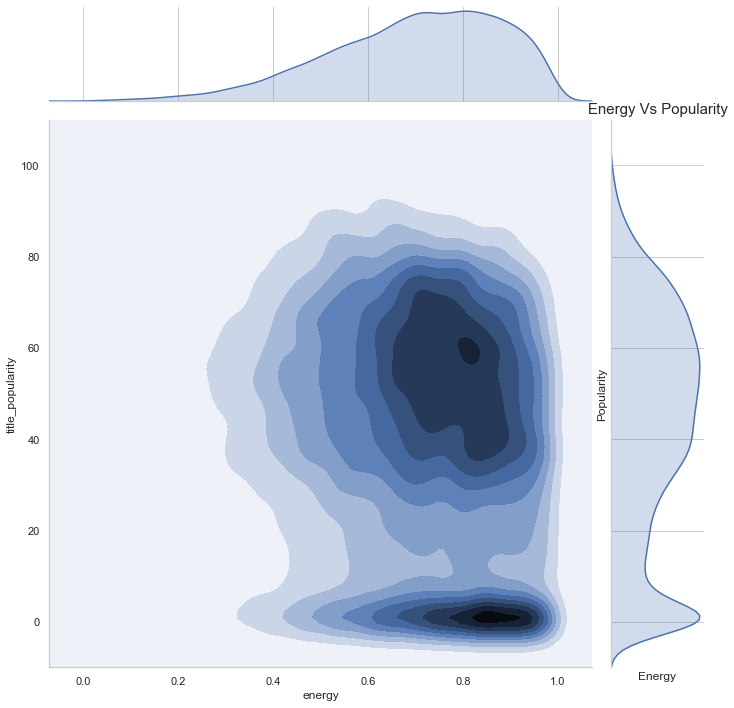

In [28]:
plt.figure(figsize=(12,8))
sns.jointplot(x=spotify_df["energy"], y=spotify_df['title_popularity'], size=10,kind="kde")
plt.ylabel('Popularity', fontsize=12)
plt.xlabel("Energy", fontsize=12)
plt.title("Energy Vs Popularity", fontsize=15)
plt.show()

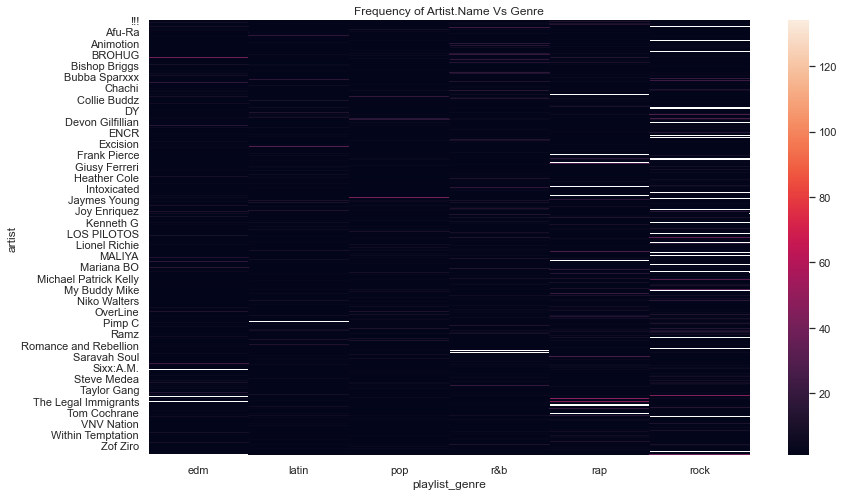

In [29]:
grouped_df = spotify_df.groupby(["artist", "playlist_genre"])["title"].aggregate("count").reset_index()
grouped_df = grouped_df.pivot('artist', 'playlist_genre', 'title')

plt.figure(figsize=(12,8))
sns.heatmap(grouped_df)
plt.title("Frequency of Artist.Name Vs Genre")
plt.show()

<Figure size 864x864 with 0 Axes>

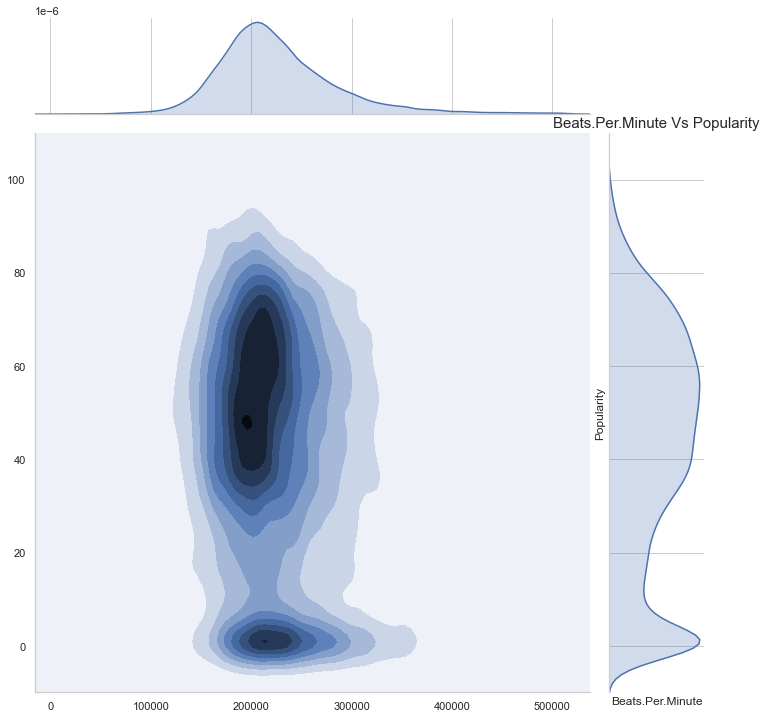

In [30]:
plt.figure(figsize=(12,12))
sns.jointplot(x=spotify_df["duration_ms"].values, y=spotify_df['title_popularity'].values, size=10, kind="kde",)
plt.ylabel('Popularity', fontsize=12)
plt.xlabel("Beats.Per.Minute", fontsize=12)
plt.title("Beats.Per.Minute Vs Popularity", fontsize=15);
#The purpose of this graph is to show connection among Beats and Popularity

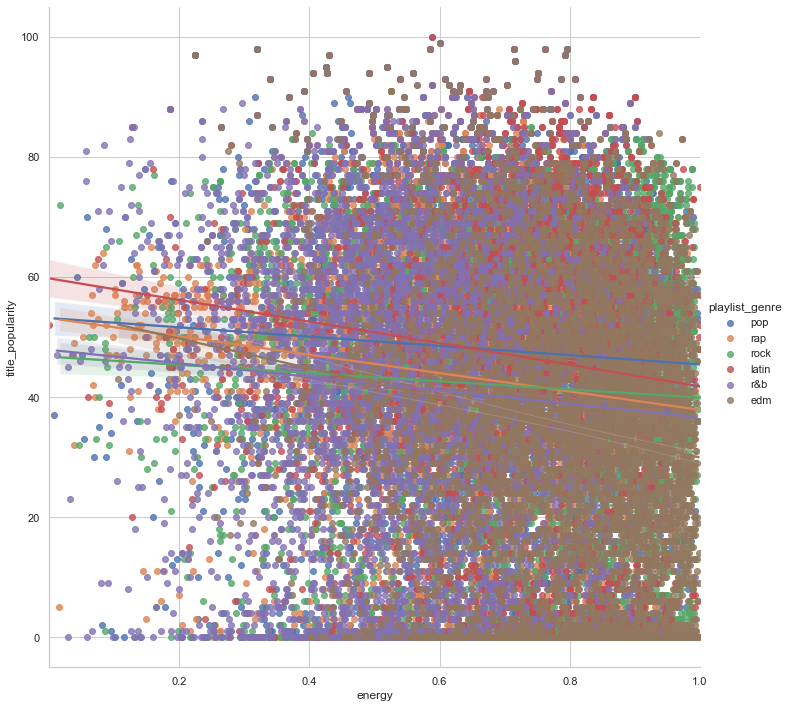

In [31]:
sns.lmplot(x="energy",y="title_popularity",data=spotify_df,size=10,hue="playlist_genre")

plt.plot()
plt.show()

## Catplot

In [80]:
spotify_df_sorted = spotify_df.sort_values("title_popularity",ascending=False)
spotify_df_sorted = spotify_df_sorted.drop_duplicates(subset=["title"], keep='first')

spotify_df_sorted.iloc[:10,]

,title,artist,title_popularity,album,album_release_date,playlist_name,playlist_genre,playlist_subgenre,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,album_release_year,album_release_month,album_release_day
20091,Dance Monkey,Tones and I,100,Dance Monkey (Stripped Back) / Dance Monkey,2019-10-17,Global Top 50 | 2020 Hits,latin,latin hip hop,0.824,0.588,...,0.0924,0.69200,0.000104,0.1490,0.513,98.027,209438,2019,10,17
30202,ROXANNE,Arizona Zervas,99,ROXANNE,2019-10-10,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,edm,pop edm,0.621,0.601,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,2019,10,10
30209,Circles,Post Malone,98,Hollywood's Bleeding,2019-09-06,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,edm,pop edm,0.695,0.762,...,0.0395,0.19200,0.002440,0.0863,0.553,120.042,215280,2019,9,6
19715,Blinding Lights,The Weeknd,98,Blinding Lights,2019-11-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,latin,latin hip hop,0.513,0.796,...,0.0629,0.00147,0.000209,0.0938,0.345,171.017,201573,2019,11,29
20252,Tusa,KAROL G,98,Tusa,2019-11-07,Urbano: Latino Vibes,latin,latin hip hop,0.803,0.715,...,0.2980,0.29500,0.000134,0.0574,0.574,101.085,200960,2019,11,7
19707,The Box,Roddy Ricch,98,Please Excuse Me For Being Antisocial,2019-12-06,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,latin,latin hip hop,0.896,0.586,...,0.0559,0.10400,0.000000,0.7900,0.642,116.971,196653,2019,12,6
19265,Memories,Maroon 5,98,Memories,2019-09-20,Verano Forever,latin,reggaeton,0.764,0.320,...,0.0546,0.83700,0.000000,0.0822,0.575,91.019,189486,2019,9,20
19719,Don't Start Now,Dua Lipa,97,Don't Start Now,2019-10-31,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,latin,latin hip hop,0.794,0.793,...,0.0842,0.01250,0.000000,0.0952,0.677,123.941,183290,2019,10,31
22940,everything i wanted,Billie Eilish,97,everything i wanted,2019-11-13,Pop Hits 2020,r&b,hip pop,0.704,0.225,...,0.0994,0.90200,0.657000,0.1060,0.243,120.006,245426,2019,11,13
30206,Falling,Trevor Daniel,97,Falling,2018-10-05,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,edm,pop edm,0.784,0.430,...,0.0364,0.12300,0.000000,0.0887,0.236,127.087,159382,2018,10,5


<Figure size 1080x720 with 0 Axes>

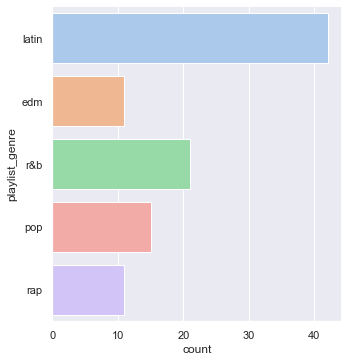

In [82]:
#It gives count of genre in spotify_df_df_df top 50 list. 


plt.figure(figsize=(15, 10))
sns.catplot(y = "playlist_genre", kind = "count",
            palette = "pastel", data = spotify_df_sorted.iloc[:100,])
plt.show()

## 'Dependence between energy and popularity'

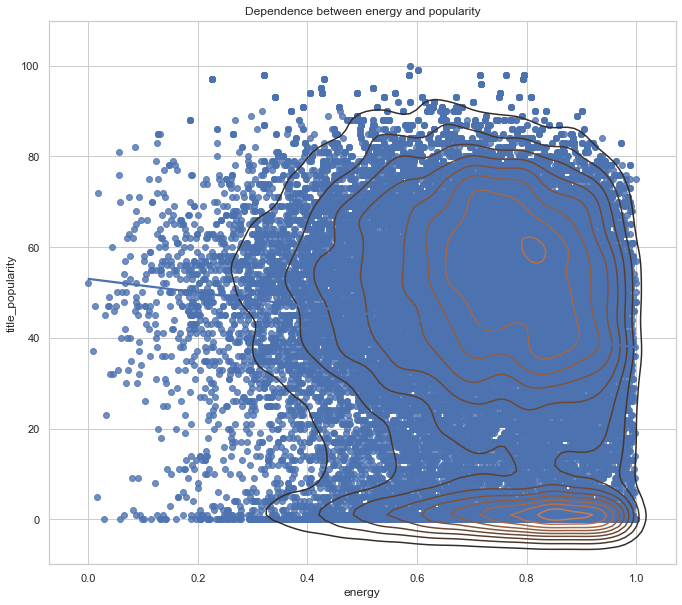

In [33]:
fig=plt.subplots(figsize=(10,10))
sns.set(palette='pastel')
plt.title('Dependence between energy and popularity')
sns.regplot(x='energy', y='title_popularity', ci=None, data=spotify_df)
sns.kdeplot(spotify_df.energy,spotify_df.title_popularity)

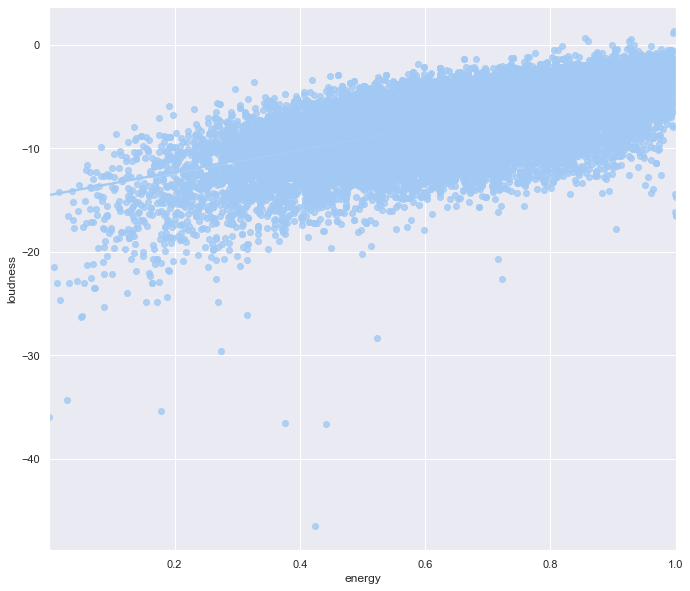

In [34]:
# Analysing the relationship between energy and loudness
fig=plt.subplots(figsize=(10,10))
sns.regplot(x='energy',y='loudness',data=spotify_df)

# 5. Plot testings! DO NOT DELETE

In [35]:
#Pie charts 
labels = spotify_df.artist.value_counts().index
sizes = spotify_df.artist.value_counts().values
colors = ['red', 'yellowgreen', 'lightcoral', 'lightskyblue','cyan', 'green', 'black','yellow']
plt.figure(figsize = (10,10))
plt.pie(sizes, labels=labels, colors=colors)
autopct=('%1.1f%%')
plt.axis('equal')
plt.show()

ValueError: 
Joey Bada$$
         ^
Expected end of text, found '$'  (at char 9), (line:1, col:10)

<Figure size 720x720 with 1 Axes>

NameError: name 'df' is not defined

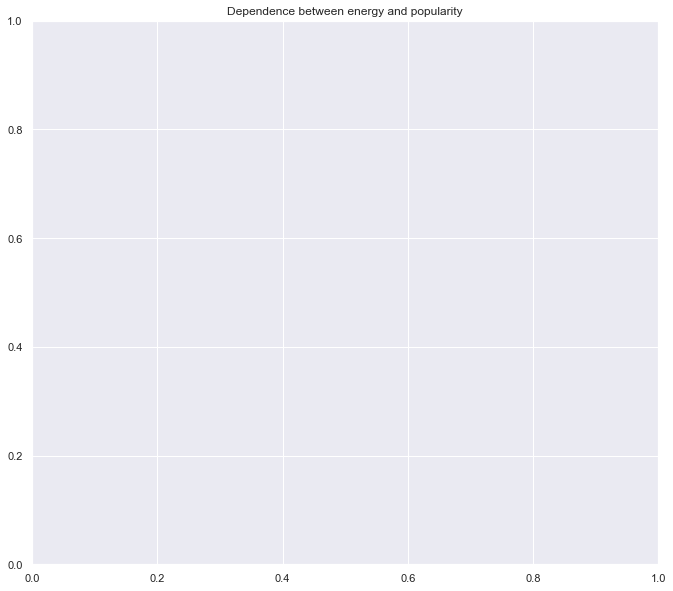

In [36]:
fig=plt.subplots(figsize=(10,10))
plt.title('Dependence between energy and popularity')
sns.regplot(x='Energy', y='Popularity',
            ci=None, data=df)
sns.kdeplot(df.Energy,df.Popularity)

In [ ]:
x = "danceability"
y = "valence"

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False, sharex=False, figsize=(10, 5))
fig.suptitle("Histograms")
h = ax2.hist2d(data_frame[x], data_frame[y], bins=20)
ax1.hist(data_frame["energy"])

ax2.set_xlabel(x)
ax2.set_ylabel(y)

ax1.set_xlabel("energy")

plt.colorbar(h[3], ax=ax2)

plt.show()

In [ ]:
import time

chosen = ["energy", "liveness", "tempo", "valence", "loudness",
          "speechiness", "acousticness", "danceability", "instrumentalness"]

X = data_frame[chosen].values
y = data_frame["loudness"].values

min_max_scaler = MinMaxScaler()
X = min_max_scaler.fit_transform(X)

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

fig = {
    "data": [
        {
            "x": tsne_results[:, 0],
            "y": tsne_results[:, 1],
            "text": text2,
            "mode": "markers",
            "marker": {"size": "8", "color": y}
        }
    ],
    "layout": {
        "xaxis": {"title": "x-tsne"},
        "yaxis": {"title": "y-tsne"}
    }
}

py.iplot(fig, filename="test-graph2")